In [ ]:
pip install --upgrade dataset-tools

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.1/48.1 kB 2.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.7/87.7 kB 5.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of opencv-python to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.0/4.0 MB 12.6 MB/s eta 0:00:0000:010:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 164.8/164.8 kB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.9/140.9 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 95.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 M

In [ ]:
import dataset_tools as dtools

dtools.download(
    dataset='dacl10k',
    dst_dir='/kaggle/working/dataset-ninja/'
)


Unpacking 'dacl10k.tar': 100%|██████████| 19843/19843 [00:16<00:00, 1205.02file/s]


'/kaggle/working/dataset-ninja/dacl10k'

In [3]:
import os

base_path = '/kaggle/working/dataset-ninja/'

def list_files(startpath):
    print(f"--- Exploring Dataset Structure at: {startpath} ---")
    for root, dirs, files in os.walk(startpath):
        level = root.replace(startpath, '').count(os.sep)
        indent = ' ' * 4 * level
        print(f"{indent}{os.path.basename(root)}/")
        subindent = ' ' * 4 * (level + 1)
        for f in files[:2]:
            print(f"{subindent}{f}")
        if len(files) > 2:
            print(f"{subindent}... ({len(files)} files total)")

if os.path.exists(base_path):
    list_files(base_path)
else:
    print("Folder not found.")

print("\n--- Sample Paths for Mask R-CNN Setup ---")
for root, dirs, files in os.walk(base_path):
    for file in files:
        if file.endswith(('.jpg', '.png')):
            print(os.path.join(root, file))
            break
    for file in files:
        if file.endswith(('.json', '.txt')):
            print(os.path.join(root, file))
            break
    break


--- Exploring Dataset Structure at: /kaggle/working/dataset-ninja/ ---
/
    dacl10k.tar
dacl10k/
    meta.json
    README.md
    ... (3 files total)
    val/
        ann/
            dacl10k_v2_validation_0700.jpg.json
            dacl10k_v2_validation_0188.jpg.json
            ... (975 files total)
        img/
            dacl10k_v2_validation_0115.jpg
            dacl10k_v2_validation_0587.jpg
            ... (975 files total)
    train/
        ann/
            dacl10k_v2_train_6387.jpg.json
            dacl10k_v2_train_6072.jpg.json
            ... (6935 files total)
        img/
            dacl10k_v2_train_6251.jpg
            dacl10k_v2_train_5413.jpg
            ... (6935 files total)
    test/
        ann/
            dacl10k_v2_testchallenge_0635.jpg.json
            dacl10k_v2_testdev_0674.jpg.json
            ... (2010 files total)
        img/
            dacl10k_v2_testdev_0183.jpg
            dacl10k_v2_testdev_0540.jpg
            ... (2010 files total)

--- Sample Pa

In [5]:
# تثبيت المكتبة مباشرة من GitHub (هذا كافٍ جداً)
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-5qrff5ch
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-5qrff5ch
  Resolved https://github.com/facebookresearch/detectron2.git to commit fd27788985af0f4ca800bca563acdb700bb890e2
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 1.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 6.3 MB/s eta 0:00:00
  Created wheel for detectron2: filename=detectron2-0.6-cp311-cp311-linux_x86_64.whl size=6441591 sha256=d12a66f907a0b2995a5a6c3c458016b9597f6e432703f829714ae4f36650df87
  Stored in directory: /tmp/pip-ephem-wheel-cache-bxzif_l3/wheels/17/d9/40/60db98e485aa9455d653e29d1046601ce96fe23647f60c1c5a
  Created wheel for fvcore: filename=fvcore-0.1.5.post20221221-py3-none-any.whl size=61397 sha256=d2a88aefeff99f74f86176ace

In [ ]:
import os
import json
import numpy as np
import cv2
import torch
import logging
from detectron2.structures import BoxMode
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.engine import DefaultTrainer, hooks
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.utils.logger import setup_logger

# 1. إعداد المسجل ليعطيك معلومات تفصيلية
setup_logger()
logger = logging.getLogger("detectron2")

# 2. استخراج الفئات
meta_path = '/kaggle/working/dataset-ninja/dacl10k/meta.json'
with open(meta_path, 'r') as f:
    meta_data = json.load(f)

CLASS_NAMES = [c.get('title') or c.get('name') for c in meta_data['classes'] if (c.get('title') or c.get('name'))]
print(f"✅ تم التعرف على الفئات: {CLASS_NAMES}")

# 3. دالة التحميل (نفس الدالة السابقة لضمان الاستقرار)
def get_dacl_dicts(img_dir, ann_dir):
    dataset_dicts = []
    if not os.path.exists(ann_dir): return []
    ann_files = [f for f in os.listdir(ann_dir) if f.endswith(".json")]
    for idx, ann_file in enumerate(ann_files):
        with open(os.path.join(ann_dir, ann_file)) as f:
            anno = json.load(f)
        img_path = os.path.join(img_dir, ann_file.replace(".json", ""))
        if not os.path.exists(img_path): continue
        record = {"file_name": img_path, "image_id": idx, "height": anno["size"]["height"], "width": anno["size"]["width"], "annotations": []}
        for obj in anno["objects"]:
            poly = [p for pair in obj["points"]["exterior"] for p in pair]
            if len(poly) < 6: continue
            if obj.get("classTitle") in CLASS_NAMES:
                record["annotations"].append({
                    "bbox": [np.min(poly[0::2]), np.min(poly[1::2]), np.max(poly[0::2]), np.max(poly[1::2])],
                    "bbox_mode": BoxMode.XYXY_ABS, "segmentation": [poly], "category_id": CLASS_NAMES.index(obj["classTitle"])
                })
        if record["annotations"]: dataset_dicts.append(record)
    return dataset_dicts

# 4. تسجيل البيانات
DatasetCatalog.clear()
for d in ["train", "val"]:
    DatasetCatalog.register(f"dacl_{d}", lambda d=d: get_dacl_dicts(f"/kaggle/working/dataset-ninja/dacl10k/{d}/img", f"/kaggle/working/dataset-ninja/dacl10k/{d}/ann"))
    MetadataCatalog.get(f"dacl_{d}").set(thing_classes=CLASS_NAMES)

# 5. بناء Trainer ذكي يعطي Feedback مستمر
class FeedbackTrainer(DefaultTrainer):
    def build_hooks(self):
        all_hooks = super().build_hooks()
        # إضافة هوك مخصص للطباعة الدورية للنتائج في الـ Console
        all_hooks.append(hooks.IterationTimer()) # حساب وقت كل دورة
        all_hooks.append(hooks.EvalHook(2000, lambda: self.test(self.cfg, self.model))) # تقييم كل 2000 خطوة
        return [h for h in all_hooks if not isinstance(h, hooks.PeriodicWriter)]

# 6. إعدادات الموديل (تحديث القيم للوصول لأعلى دقة)
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("dacl_train",)
cfg.DATASETS.TEST = ("dacl_val",)
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")

cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 30000            
cfg.SOLVER.STEPS = (15000, 21000)      # مواعيد تقليل السرعة لزيادة الدقة
cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.CHECKPOINT_PERIOD = 5000     # حفظ نسخة كل 5000 خطوة

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(CLASS_NAMES)
cfg.OUTPUT_DIR = "/kaggle/working/output_ultimate"

# 7. تشغيل التدريب
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
print("🚀 يبدأ التدريب المطور الآن.. الموديل سيتوقف كل 2000 خطوة ليعطيك تقرير الدقة الحالي")
trainer = FeedbackTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

✅ تم التعرف على الفئات: ['alligator crack', 'bearing', 'cavity', 'crack', 'drainage', 'efflorescence', 'expansion joint', 'exposed rebars', 'graffiti', 'hollowareas', 'joint tape', 'protective equipment', 'restformwork', 'rockpocket', 'rust', 'spalling', 'washouts/concrete corrosion', 'weathering', 'wetspot']
🚀 يبدأ التدريب المطور الآن.. الموديل سيتوقف كل 2000 خطوة ليعطيك تقرير الدقة الحالي
[12/28 02:29:11 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_siz

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (20, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (20,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (76, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (76,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (19, 256, 1, 

[12/28 02:29:15 d2.engine.train_loop]: Starting training from iteration 0
[12/28 02:39:40 d2.data.build]: Distribution of instances among all 19 categories:
|   category    | #instances   |   category    | #instances   |   category    | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:-------------:|:-------------|
| alligator c.. | 48           |    bearing    | 160          |    cavity     | 1152         |
|     crack     | 472          |   drainage    | 248          | efflorescence | 515          |
| expansion j.. | 56           | exposed reb.. | 247          |   graffiti    | 320          |
|  hollowareas  | 194          |  joint tape   | 155          | protective .. | 214          |
| restformwork  | 171          |  rockpocket   | 92           |     rust      | 1883         |
|   spalling    | 1400         | washouts/co.. | 52           |  weathering   | 570          |
|    wetspot    | 218          |               |              |               |    

[12/28 04:55:06 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /kaggle/working/output_ultimate/model_final.pth ...


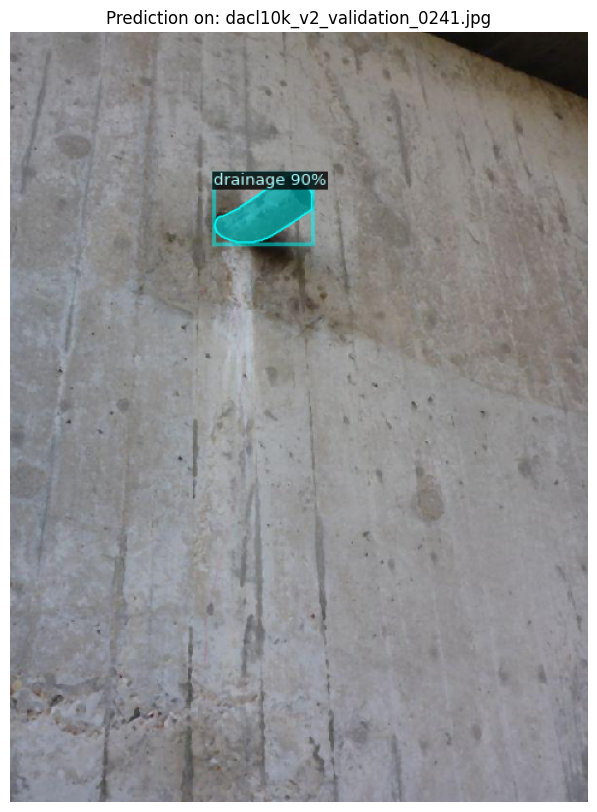

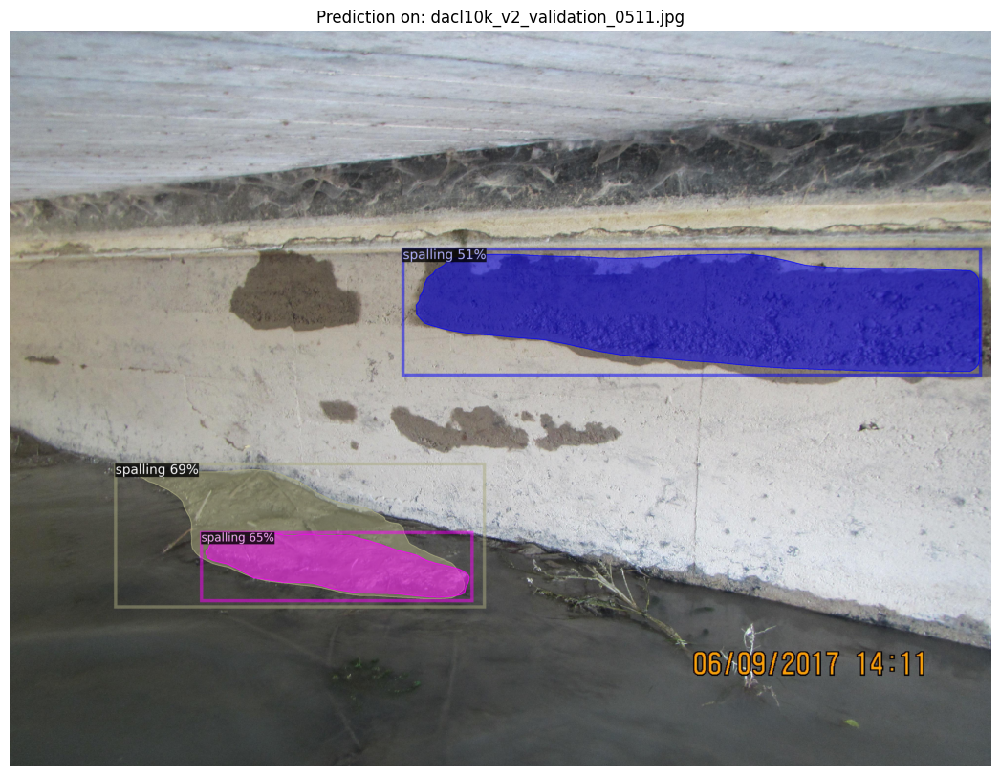

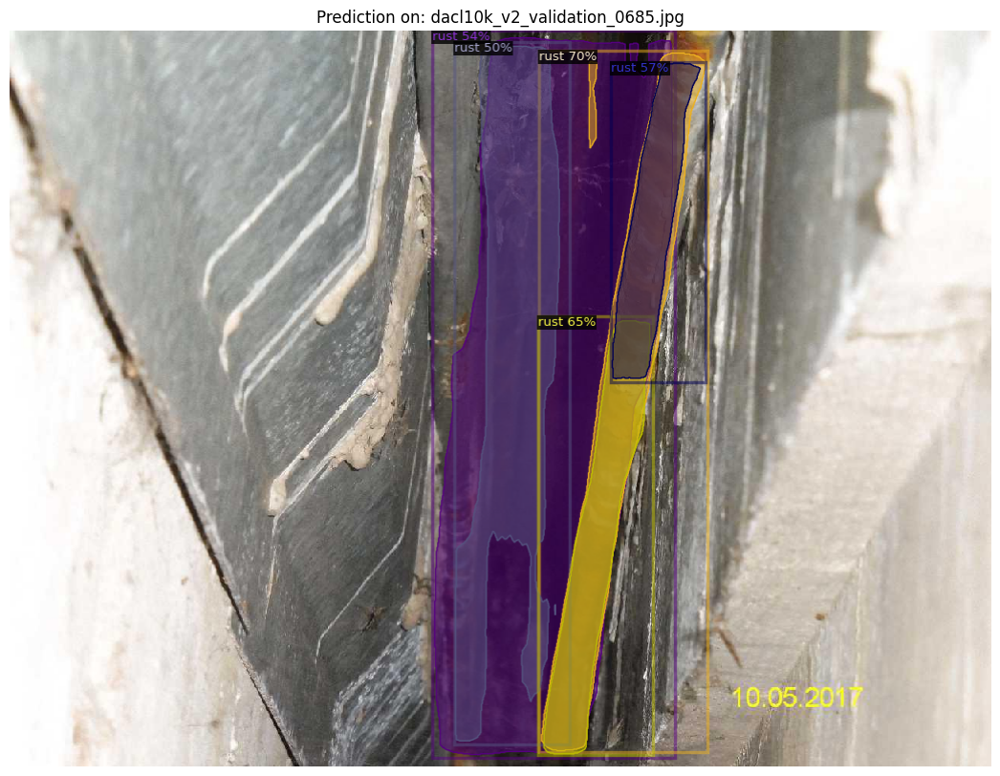

In [26]:
import os
import cv2
import random
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
import matplotlib.pyplot as plt

# 1. تحميل الوزن النهائي
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "/kaggle/working/output_ultimate/model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 # إظهار النتائج القوية فقط
predictor = DefaultPredictor(cfg)

# 2. تجربة على 3 صور من الـ Validation (صور لم يتدرب عليها)
dataset_dicts = DatasetCatalog.get("dacl_val")
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    
    # رسم النتائج
    v = Visualizer(im[:, :, ::-1], metadata=MetadataCatalog.get("dacl_val"), scale=0.8)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    
    plt.figure(figsize=(15, 10))
    plt.imshow(out.get_image())
    plt.title(f"Prediction on: {os.path.basename(d['file_name'])}")
    plt.axis("off")
    plt.show()

[12/28 04:57:16 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /kaggle/working/output_ultimate/model_final.pth ...


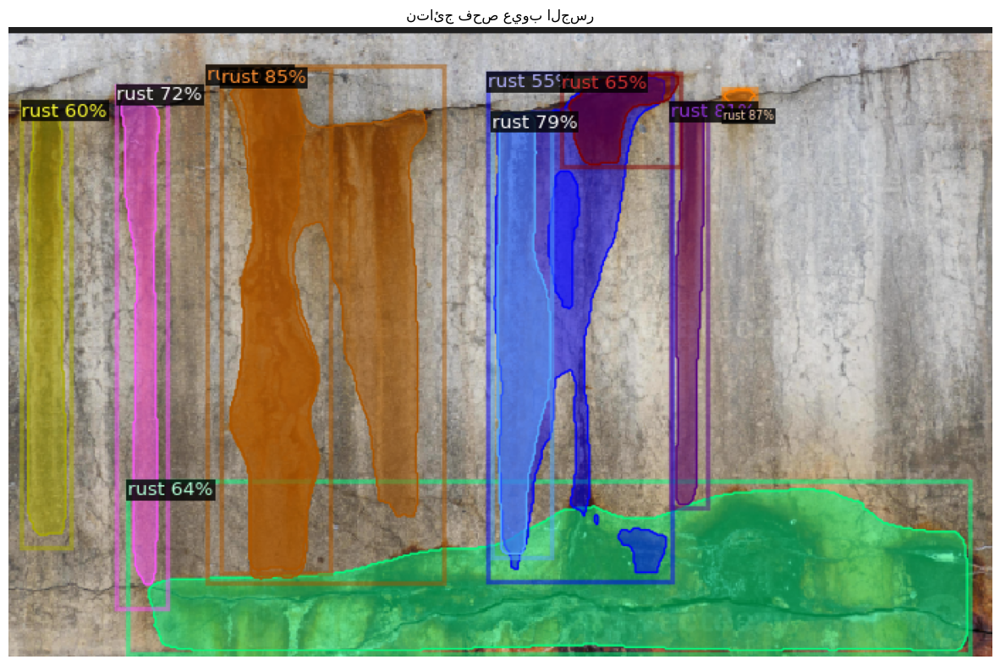

In [28]:
import cv2
import os
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.config import get_cfg
from detectron2 import model_zoo
import matplotlib.pyplot as plt

# 1. إعداد الإعدادات (تأكد أن هذا الجزء تم تشغيله مرة واحدة)
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 19 
cfg.MODEL.WEIGHTS = os.path.join("output", "/kaggle/working/output_ultimate/model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 
cfg.MODEL.DEVICE = "cuda"
predictor = DefaultPredictor(cfg)

# 2. تحديد مسار الصورة التي سترفعها
# نصيحة: ارفع الصورة يدوياً في كاجل واضغط كليك يمين عليها واختر "Copy Path" وضعه هنا
image_path = "/kaggle/input/data-test/Screenshot 2025-12-28 024248.png" 

if not os.path.exists(image_path):
    print(f"الصورة غير موجودة في المسار: {image_path}. من فضلك ارفع الصورة أولاً.")
else:
    # 3. قراءة الصورة
    im = cv2.imread(image_path)

    # 4. التوقع (Prediction)
    outputs = predictor(im)

    # 5. العرض باستخدام الـ Metadata (لإظهار أسماء العيوب بالإنجليزية)
    # ملاحظة: نستخدم MetadataCatalog الخاص ببيانات التدريب dacl_train
    v = Visualizer(im[:, :, ::-1], 
                   metadata=MetadataCatalog.get("dacl_train"), 
                   scale=1.2)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    # 6. إظهار النتيجة
    plt.figure(figsize=(15, 10))
    plt.imshow(out.get_image())
    plt.title("نتائج فحص عيوب الجسر")
    plt.axis("off")
    plt.show()

[12/28 05:15:49 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /kaggle/working/output_ultimate/model_final.pth ...


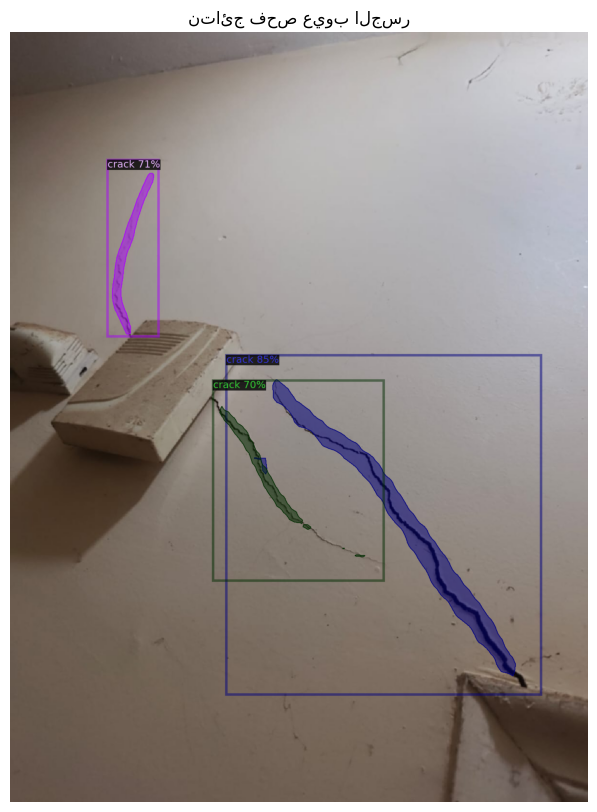

In [43]:
import cv2
import os
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.config import get_cfg
from detectron2 import model_zoo
import matplotlib.pyplot as plt

# 1. إعداد الإعدادات (تأكد أن هذا الجزء تم تشغيله مرة واحدة)
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 19 
cfg.MODEL.WEIGHTS = os.path.join("output", "/kaggle/working/output_ultimate/model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 
cfg.MODEL.DEVICE = "cuda"
predictor = DefaultPredictor(cfg)

# 2. تحديد مسار الصورة التي سترفعها
# نصيحة: ارفع الصورة يدوياً في كاجل واضغط كليك يمين عليها واختر "Copy Path" وضعه هنا
image_path = "/kaggle/input/kkkkkkkkkk/J.jpeg" 

if not os.path.exists(image_path):
    print(f"الصورة غير موجودة في المسار: {image_path}. من فضلك ارفع الصورة أولاً.")
else:
    # 3. قراءة الصورة
    im = cv2.imread(image_path)

    # 4. التوقع (Prediction)
    outputs = predictor(im)

    # 5. العرض باستخدام الـ Metadata (لإظهار أسماء العيوب بالإنجليزية)
    # ملاحظة: نستخدم MetadataCatalog الخاص ببيانات التدريب dacl_train
    v = Visualizer(im[:, :, ::-1], 
                   metadata=MetadataCatalog.get("dacl_train"), 
                   scale=1.2)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    # 6. إظهار النتيجة
    plt.figure(figsize=(15, 10))
    plt.imshow(out.get_image())
    plt.title("نتائج فحص عيوب الجسر")
    plt.axis("off")
    plt.show()

[12/28 04:57:50 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /kaggle/working/output_ultimate/model_final.pth ...


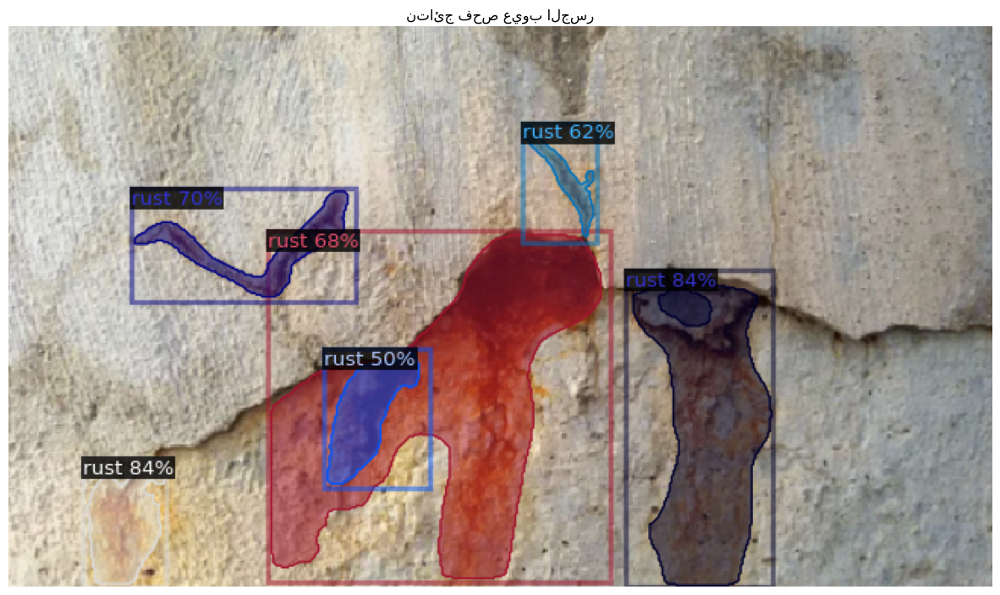

In [29]:
import cv2
import os
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.config import get_cfg
from detectron2 import model_zoo
import matplotlib.pyplot as plt

# 1. إعداد الإعدادات (تأكد أن هذا الجزء تم تشغيله مرة واحدة)
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 19 
cfg.MODEL.WEIGHTS = os.path.join("output", "/kaggle/working/output_ultimate/model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 
cfg.MODEL.DEVICE = "cuda"
predictor = DefaultPredictor(cfg)

# 2. تحديد مسار الصورة التي سترفعها
# نصيحة: ارفع الصورة يدوياً في كاجل واضغط كليك يمين عليها واختر "Copy Path" وضعه هنا
image_path = "/kaggle/input/data-test/Screenshot 2025-12-28 024417.png" 

if not os.path.exists(image_path):
    print(f"الصورة غير موجودة في المسار: {image_path}. من فضلك ارفع الصورة أولاً.")
else:
    # 3. قراءة الصورة
    im = cv2.imread(image_path)

    # 4. التوقع (Prediction)
    outputs = predictor(im)

    # 5. العرض باستخدام الـ Metadata (لإظهار أسماء العيوب بالإنجليزية)
    # ملاحظة: نستخدم MetadataCatalog الخاص ببيانات التدريب dacl_train
    v = Visualizer(im[:, :, ::-1], 
                   metadata=MetadataCatalog.get("dacl_train"), 
                   scale=1.2)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    # 6. إظهار النتيجة
    plt.figure(figsize=(15, 10))
    plt.imshow(out.get_image())
    plt.title("نتائج فحص عيوب الجسر")
    plt.axis("off")
    plt.show()

[12/28 04:59:33 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /kaggle/working/output_ultimate/model_final.pth ...


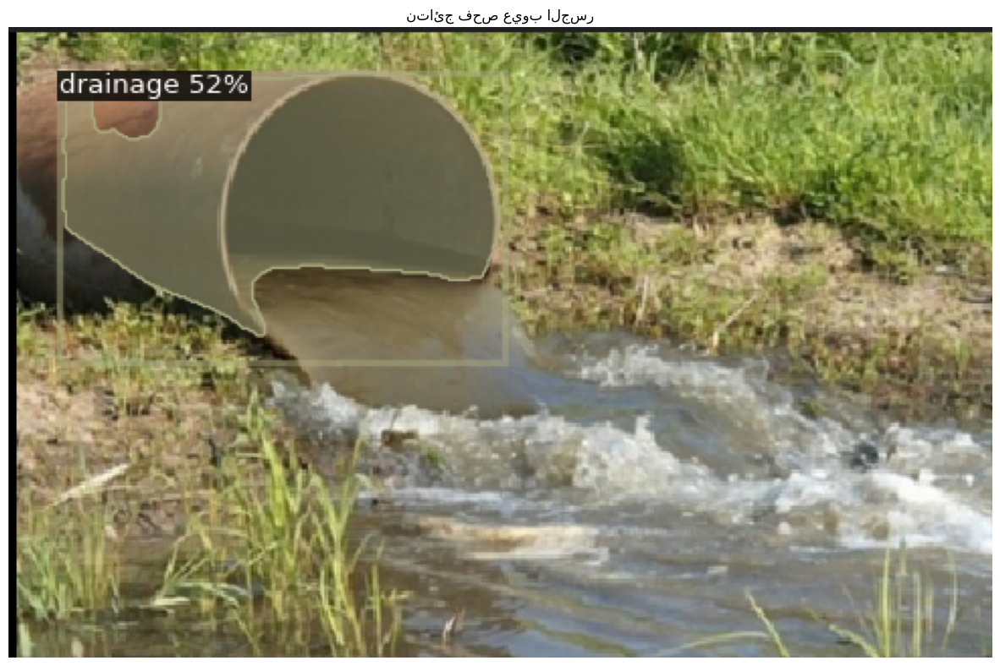

In [31]:
import cv2
import os
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.config import get_cfg
from detectron2 import model_zoo
import matplotlib.pyplot as plt

# 1. إعداد الإعدادات (تأكد أن هذا الجزء تم تشغيله مرة واحدة)
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 19 
cfg.MODEL.WEIGHTS = os.path.join("output", "/kaggle/working/output_ultimate/model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 
cfg.MODEL.DEVICE = "cuda"
predictor = DefaultPredictor(cfg)

# 2. تحديد مسار الصورة التي سترفعها
# نصيحة: ارفع الصورة يدوياً في كاجل واضغط كليك يمين عليها واختر "Copy Path" وضعه هنا
image_path = "/kaggle/input/testtttoo/Screenshot 2025-12-28 065845.png" 

if not os.path.exists(image_path):
    print(f"الصورة غير موجودة في المسار: {image_path}. من فضلك ارفع الصورة أولاً.")
else:
    # 3. قراءة الصورة
    im = cv2.imread(image_path)

    # 4. التوقع (Prediction)
    outputs = predictor(im)

    # 5. العرض باستخدام الـ Metadata (لإظهار أسماء العيوب بالإنجليزية)
    # ملاحظة: نستخدم MetadataCatalog الخاص ببيانات التدريب dacl_train
    v = Visualizer(im[:, :, ::-1], 
                   metadata=MetadataCatalog.get("dacl_train"), 
                   scale=1.2)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    # 6. إظهار النتيجة
    plt.figure(figsize=(15, 10))
    plt.imshow(out.get_image())
    plt.title("نتائج فحص عيوب الجسر")
    plt.axis("off")
    plt.show()

[12/28 05:01:58 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /kaggle/working/output_ultimate/model_final.pth ...


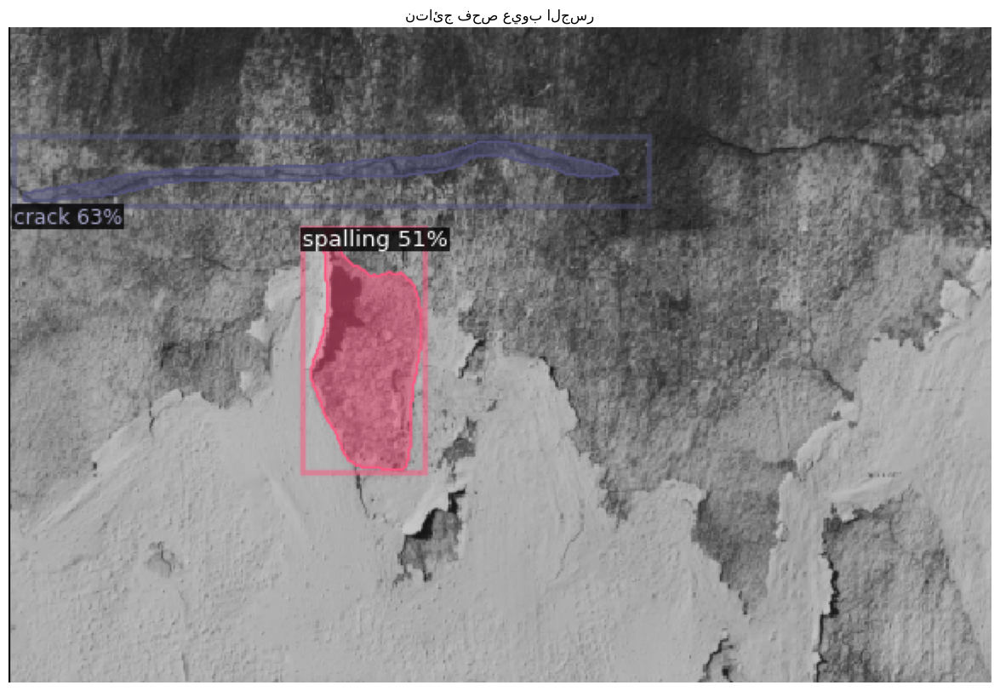

In [38]:
import cv2
import os
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.config import get_cfg
from detectron2 import model_zoo
import matplotlib.pyplot as plt

# 1. إعداد الإعدادات (تأكد أن هذا الجزء تم تشغيله مرة واحدة)
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 19 
cfg.MODEL.WEIGHTS = os.path.join("output", "/kaggle/working/output_ultimate/model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 
cfg.MODEL.DEVICE = "cuda"
predictor = DefaultPredictor(cfg)

# 2. تحديد مسار الصورة التي سترفعها
# نصيحة: ارفع الصورة يدوياً في كاجل واضغط كليك يمين عليها واختر "Copy Path" وضعه هنا
image_path = "/kaggle/input/data-test/Screenshot 2025-12-28 031121.png" 

if not os.path.exists(image_path):
    print(f"الصورة غير موجودة في المسار: {image_path}. من فضلك ارفع الصورة أولاً.")
else:
    # 3. قراءة الصورة
    im = cv2.imread(image_path)

    # 4. التوقع (Prediction)
    outputs = predictor(im)

    # 5. العرض باستخدام الـ Metadata (لإظهار أسماء العيوب بالإنجليزية)
    # ملاحظة: نستخدم MetadataCatalog الخاص ببيانات التدريب dacl_train
    v = Visualizer(im[:, :, ::-1], 
                   metadata=MetadataCatalog.get("dacl_train"), 
                   scale=1.2)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    # 6. إظهار النتيجة
    plt.figure(figsize=(15, 10))
    plt.imshow(out.get_image())
    plt.title("نتائج فحص عيوب الجسر")
    plt.axis("off")
    plt.show()

[12/28 05:04:21 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /kaggle/working/output_ultimate/model_final.pth ...


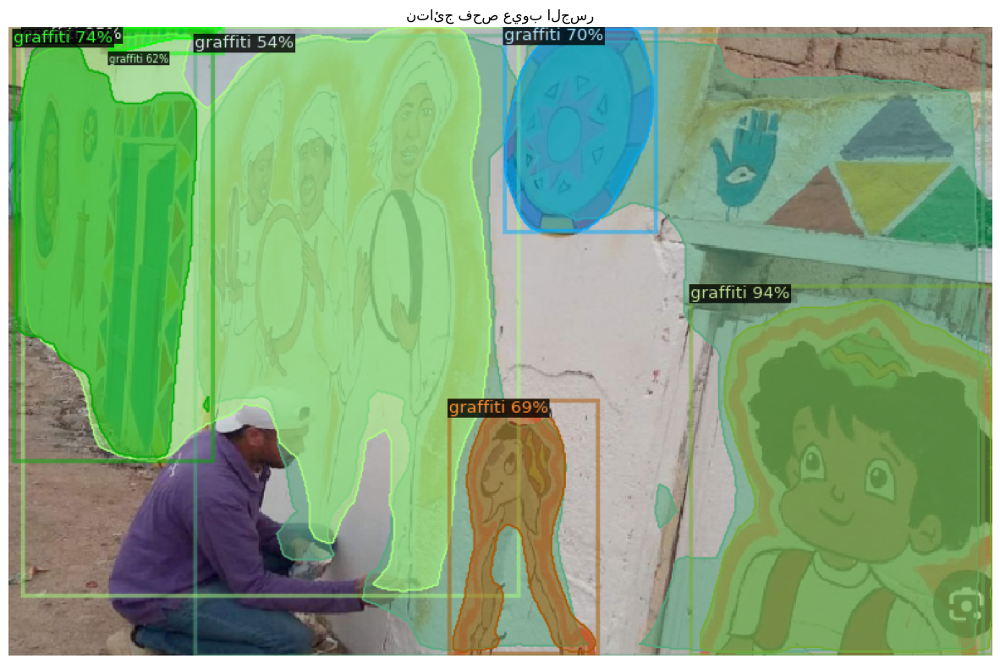

In [39]:
import cv2
import os
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.config import get_cfg
from detectron2 import model_zoo
import matplotlib.pyplot as plt

# 1. إعداد الإعدادات (تأكد أن هذا الجزء تم تشغيله مرة واحدة)
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 19 
cfg.MODEL.WEIGHTS = os.path.join("output", "/kaggle/working/output_ultimate/model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 
cfg.MODEL.DEVICE = "cuda"
predictor = DefaultPredictor(cfg)

# 2. تحديد مسار الصورة التي سترفعها
# نصيحة: ارفع الصورة يدوياً في كاجل واضغط كليك يمين عليها واختر "Copy Path" وضعه هنا
image_path = "/kaggle/input/ffffffff/Screenshot 2025-12-28 070327.png" 

if not os.path.exists(image_path):
    print(f"الصورة غير موجودة في المسار: {image_path}. من فضلك ارفع الصورة أولاً.")
else:
    # 3. قراءة الصورة
    im = cv2.imread(image_path)

    # 4. التوقع (Prediction)
    outputs = predictor(im)

    # 5. العرض باستخدام الـ Metadata (لإظهار أسماء العيوب بالإنجليزية)
    # ملاحظة: نستخدم MetadataCatalog الخاص ببيانات التدريب dacl_train
    v = Visualizer(im[:, :, ::-1], 
                   metadata=MetadataCatalog.get("dacl_train"), 
                   scale=1.2)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    # 6. إظهار النتيجة
    plt.figure(figsize=(15, 10))
    plt.imshow(out.get_image())
    plt.title("نتائج فحص عيوب الجسر")
    plt.axis("off")
    plt.show()

[12/28 05:05:05 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /kaggle/working/output_ultimate/model_final.pth ...


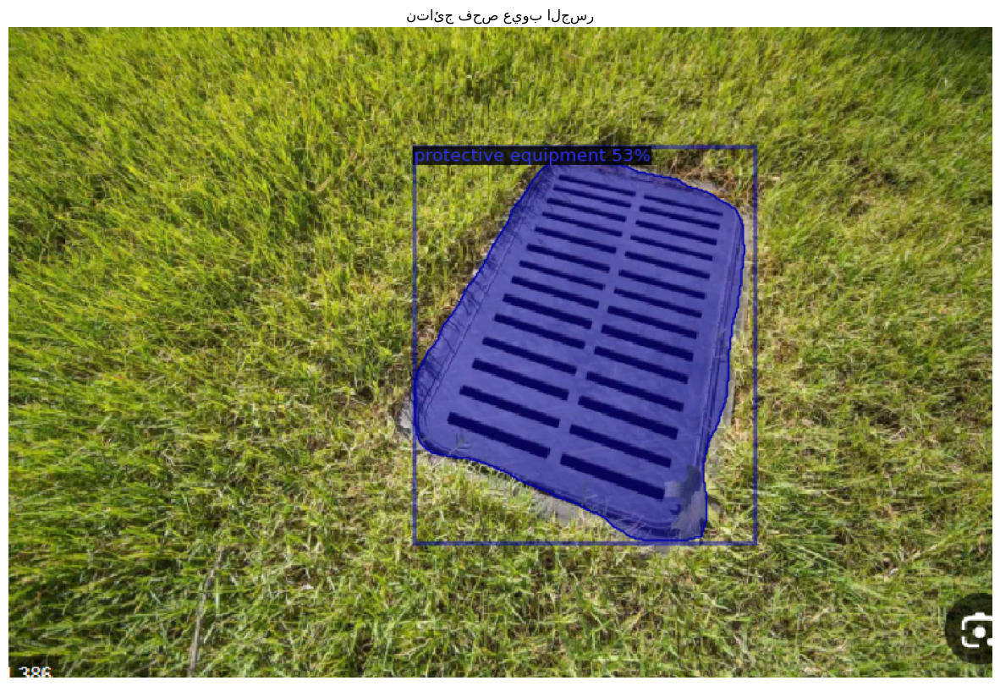

In [40]:
import cv2
import os
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.config import get_cfg
from detectron2 import model_zoo
import matplotlib.pyplot as plt

# 1. إعداد الإعدادات (تأكد أن هذا الجزء تم تشغيله مرة واحدة)
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 19 
cfg.MODEL.WEIGHTS = os.path.join("output", "/kaggle/working/output_ultimate/model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 
cfg.MODEL.DEVICE = "cuda"
predictor = DefaultPredictor(cfg)

# 2. تحديد مسار الصورة التي سترفعها
# نصيحة: ارفع الصورة يدوياً في كاجل واضغط كليك يمين عليها واختر "Copy Path" وضعه هنا
image_path = "/kaggle/input/ffffffff/Screenshot 2025-12-28 070238.png" 

if not os.path.exists(image_path):
    print(f"الصورة غير موجودة في المسار: {image_path}. من فضلك ارفع الصورة أولاً.")
else:
    # 3. قراءة الصورة
    im = cv2.imread(image_path)

    # 4. التوقع (Prediction)
    outputs = predictor(im)

    # 5. العرض باستخدام الـ Metadata (لإظهار أسماء العيوب بالإنجليزية)
    # ملاحظة: نستخدم MetadataCatalog الخاص ببيانات التدريب dacl_train
    v = Visualizer(im[:, :, ::-1], 
                   metadata=MetadataCatalog.get("dacl_train"), 
                   scale=1.2)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    # 6. إظهار النتيجة
    plt.figure(figsize=(15, 10))
    plt.imshow(out.get_image())
    plt.title("نتائج فحص عيوب الجسر")
    plt.axis("off")
    plt.show()